In [1]:
using DelimitedFiles;
using JSON
using DelimitedFiles;
using Plots, LaTeXStrings;
using Printf


function read_run_results(run_number)
    U_list = []
    M_list = []
    run="new_MFG_convergence_rate_runs/run"*string(run_number)
    params = JSON.parsefile(run*"_params.json")
    Δt = params["Δt"]
    for h in params["h_list"]
        push!(U_list, readdlm(run*"_U_mat_conv_h$(h)_deltat$(Δt).csv", ','))
        push!(M_list, readdlm(run*"_M_mat_conv_h$(h)_deltat$(Δt).csv", ','))
    end
    return params, U_list, M_list
end

function read_run_iterations(run_number, h)
    U_iter_list = []
    M_iter_list = []
    run="new_MFG_convergence_rate_runs/run"*string(run_number)
    params = JSON.parsefile(run*"_params.json")
    Δt = params["Δt"]
    #if h ∉ params["h_list"] 
    #    println("h not in h_list")
    #    return
    #end
    # Find all files for this run
    files = readdir("new_MFG_iteration_plots")
    
    iter_numbers = Int[]

    for f in files
        if occursin("run$(run_number)_iter", f) && occursin("M_mat_conv_h$(h)", f)
            m =  match(r"_iter(\d+)", f)
            if m !== nothing
                push!(iter_numbers, parse(Int, m.captures[1]))
            end
        end
    end
    println("iter_numbers: ", iter_numbers)
    iter_folder="new_MFG_iteration_plots/run"*string(run_number)
    final_iter = maximum(iter_numbers)
    for iter in 0:final_iter
        push!(U_iter_list, readdlm(iter_folder*"_iter$(iter)_U_mat_conv_h$(h)_deltat$(Δt).csv", ','))
        push!(M_iter_list, readdlm(iter_folder*"_iter$(iter)_M_mat_conv_h$(h)_deltat$(Δt).csv", ','))
    end
    return params, U_iter_list, M_iter_list, final_iter
end

params, U_list, M_list = read_run_results(1)
println("params: ", params)
println("size(U_list[1]): ", size(U_list[1]))

#PLOT RESULTS


function plot_iterations(run_number, h, save_figures=false)
    params, U_list, M_list, final_iter = read_run_iterations(run_number, h)
    (h_list, α, x_l, x_r, Δt, t_0, T, ν, num_it_MFG, num_it_HJB, δ, R) = (params["h_list"], params["α"], params["x_l"], params["x_r"], params["Δt"], params["t_0"], params["T"], params["ν"], params["num_it_MFG"], params["num_it_HJB"],  params["δ"], params["R"])
    
    println("Plot results for run number: ", run_number) 
    println("Plot iterations from h=",h)
    println("!!")
    println("parameters: ", params)
    println("size(U_list): ", size(U_list))
    flush(stdout)

    final_iter = #largest iteration for this run number and this h.
    for i in 0:final_iter
        #println("----")
        #println("i: ", i)
        x_vec = x_l:h:(x_r-h);
        N_h =length(x_vec);
        t_vec = t_0:Δt:(T-Δt)
        N_T =length(t_vec)
        #println("x_vec: ", x_vec)
        #println("N_h: ", N_h)
        #println("t_vec: ", t_vec)
        #println("N_T: ", N_T)

        plot_U_mat = transpose(reverse(transpose(U_list[i+1]), dims=2));
        plot_M_mat = transpose(reverse(transpose(M_list[i+1]), dims=2));

        #println("i: ", i, "SUM: ", sum(plot_M_mat[:,end]*h))
        
        zticks1 = 5:5:20
        p1 = plot(t_vec, x_vec, plot_M_mat, ylabel=L"x", xlabel=L"t",  st=:surface, labelfontsize=15, zlim=(0,50),
        color=cgrad(:cool, rev=false), size=(500, 500), xlim=(0,t_vec[end]), ylim=(0.1,0.9), legend=false, camera=(90- 20, 20), xflip=true, zticks=zticks1, title=L"m(x,t)")
        zticks2 = 0.5:0.5:4
        p2 = plot(t_vec, x_vec, plot_U_mat, xlabel=L"t", ylabel=L"x",   st=:surface, labelfontsize=15,
        color=:cividis, size=(500, 500), xlim=(0,t_vec[end]), zlim=(0, 4), legend=false, camera=(90- 20, 40), xflip=true, zticks=zticks2, title=L"u(x,t)",  ylim=(0, 1))

        # Save plots as PDF with h in the filename
        if save_figures
            savefig(p1, joinpath("figures",run*"_plot_new_M_h$(h)_deltat$(Δt).pdf"))
            savefig(p2, joinpath("figures",run*"_plot_new_U_h$(h)_deltat$(Δt).pdf"))
        end 
        p = plot(p1, p2, layout=2, size=(600, 300), title="iter"*string(i)*"_h="*string(h), titlefontsize=10)
        #println("Display:") 
        display(p)
        # println("i: ", i)
        # if i==1
        #     break
        # end
        #println("!!!!!!!!!")
    end
end


function plot_results(run_number, h_start=1, h_end=-1, save_figures=false)
    params, U_list, M_list = read_run_results(run_number)
    (h_list, α, x_l, x_r, Δt, t_0, T, ν, num_it_MFG, num_it_HJB, δ, R) = (params["h_list"], params["α"], params["x_l"], params["x_r"], params["Δt"], params["t_0"], params["T"], params["ν"], params["num_it_MFG"], params["num_it_HJB"],  params["δ"], params["R"])
    
    if h_end==-1
        h_end=length(h_list)
    end
    println("Plot results for run number: ", run_number) 
    println("!!")
    println("parameters: ", params)
    println("size(U_list): ", size(U_list))
    flush(stdout)
    println("h_list[h_start:h_end]: ", h_list[h_start:h_end])
    for (i,h) in enumerate(h_list[1:h_end])
        if i<h_start 
            continue
        end
        println("----")
        println("i: ", i)
        x_vec = x_l:h:(x_r-h);
        N_h =length(x_vec);
        t_vec = t_0:Δt:(T-Δt)
        N_T =length(t_vec)
        println("x_vec: ", x_vec)
        println("N_h: ", N_h)
        println("t_vec: ", t_vec)
        println("N_T: ", N_T)

        x_reverse_plot = false
        if x_reverse_plot        
            plot_U_mat = transpose(reverse(transpose(U_list[i]), dims=2));
            plot_M_mat = transpose(reverse(transpose(M_list[i]), dims=2));
        else 
            plot_U_mat = (U_list[i]);
            plot_M_mat = (M_list[i]);
        end

        println("SUM: ", sum(plot_M_mat[:,end]*h))
        
  #=       zticks1 = 5:5:20
        p1 = plot(t_vec, x_vec, reverse(plot_M_mat, dims=1), ylabel=L"x", xlabel=L"t",  st=:surface, labelfontsize=15, zlim=(0,50),
        color=cgrad(:cool, rev=false), size=(500, 500), xlim=(0,t_vec[end]), ylim=(0.1,0.9), legend=false, camera=(90- 20, 20), xflip=true, zticks=zticks1, title=L"m(x,t)")
        zticks2 = 0.5:0.5:4
        p2 = plot(t_vec, x_vec, reverse(plot_U_mat, dims=1), xlabel=L"t", ylabel=L"x",   st=:surface, labelfontsize=15,
        color=:cividis, size=(500, 500), xlim=(0,t_vec[end]), zlim=(0, 4), legend=false, camera=(90- 20, 40), xflip=true, zticks=zticks2, title=L"u(x,t)",  ylim=(0, 1)) =#

        a1=20
        a4=25
        a2=30
        a3=40

        p1 = plot(t_vec, x_vec, reverse(plot_M_mat, dims=1), ylabel=L"x", xlabel=L"t",  st=:surface, guidefont = font(20), tickfont = font(12), legendfont = font(14), titlefont=font(20),
        color=cgrad(:cool, rev=false), size=(750, 750), xlim=(0,t_vec[end]), ylim=(0,1), legend=false, camera=(90- a1, a2), xflip=true, title=L"m(x,t)", zlim=(0,20))
        p2 = plot(t_vec, x_vec, reverse(plot_U_mat, dims=1), xlabel=L"t", ylabel=L"x",   st=:surface, guidefont = font(20), tickfont = font(12), legendfont = font(14), titlefont=font(20),
        color=:cividis, size=(750, 750), xlim=(0,t_vec[end]), legend=false, camera=(90- a4, a3), xflip=true,  title=L"u(x,t)",  ylim=(0, 1), zlim=(0,4))

        # Save plots as PDF with h in the filename
        if save_figures
            run="run"*string(run_number)
            if x_reverse_plot
                savefig(p1, joinpath("figures",run*"_plot_new_M_h$(h)_deltat$(Δt).pdf"))
                savefig(p2, joinpath("figures",run*"_plot_new_U_h$(h)_deltat$(Δt).pdf"))
            else 
                savefig(p1, joinpath("figures",run*"_plot_new_M_h$(h)_deltat$(Δt)_not_rev.pdf"))
                savefig(p2, joinpath("figures",run*"_plot_new_U_h$(h)_deltat$(Δt)_not_rev.pdf"))
            end
        end 
        p = plot(p1, p2, layout=2, size=(600, 300), title="h="*string(h), titlefontsize=10)
        println("Display:") 
        display(p1)
        display(p2)
        # println("i: ", i)
        # if i==1
        #     break
        # end
        println("!!!!!!!!!")
        

    end
end


params: Dict{String, Any}("T" => 1, "δ" => 0.4, "x_l" => -1, "h_list" => Any[0.015625, 0.0078125], "x_r" => 2, "ν" => 0.0081, "α" => 1.5, "num_it_HJB" => 20, "Δt" => 0.01, "num_it_MFG" => 50, "R" => 30, "t_0" => 0)
size(U_list[1]): (192, 100)


plot_results (generic function with 4 methods)

iter_numbers: [0, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 1, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 2, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 3, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 4, 50, 5, 6, 7, 8, 9]
Plot results for run number: 36
Plot iterations from h=0.00390625
!!
parameters: Dict{String, Any}("T" => 2, "δ" => 0.4, "x_l" => -1, "h_list" => Any[0.00390625], "x_r" => 2, "ν" => 0.0081, "α" => 1.5, "num_it_HJB" => 20, "Δt" => 0.001, "num_it_MFG" => 50, "R" => 30, "t_0" => 0)
size(U_list): (51,)


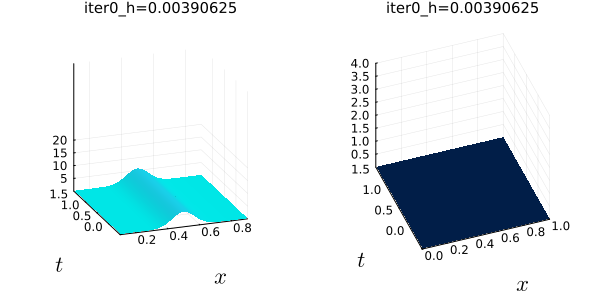

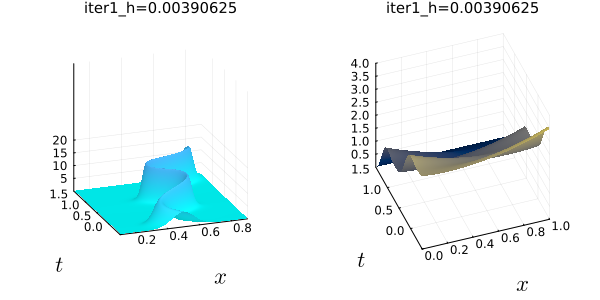

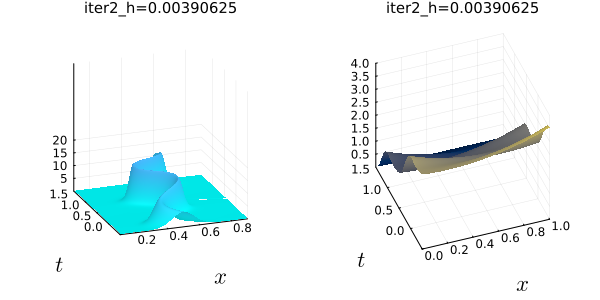

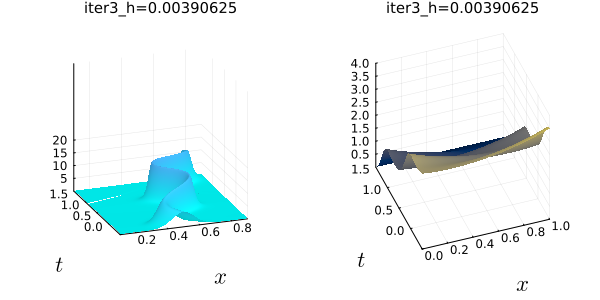

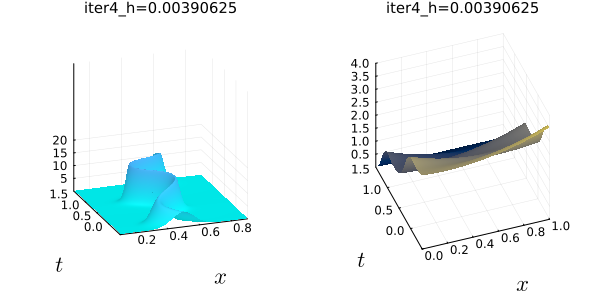

...

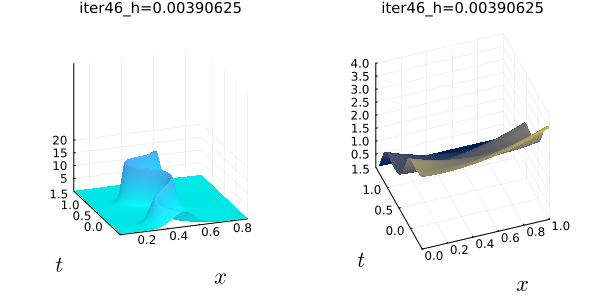

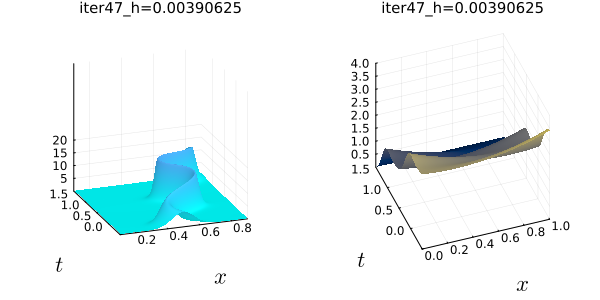

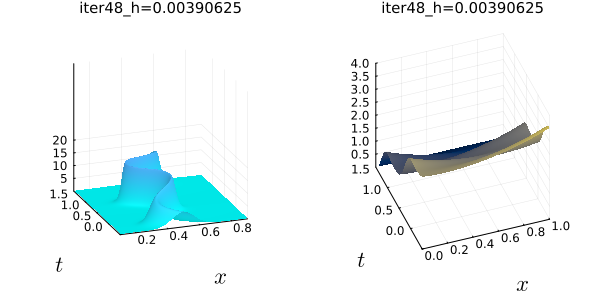

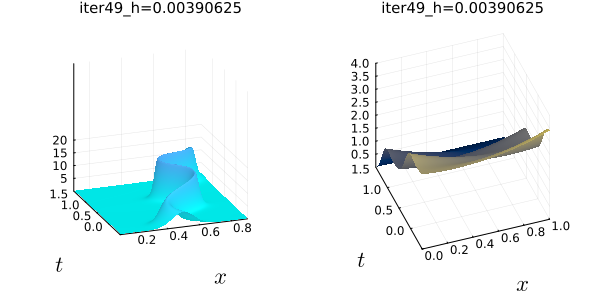

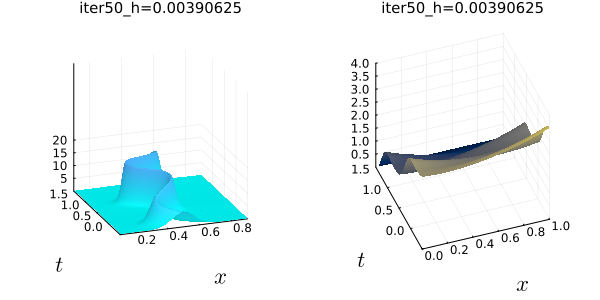

In [2]:
plot_iterations(36, 0.00390625)